In [2]:
import numpy as np
import pandas as pd
import glob, pylab
import pydicom
from os import listdir
from os.path import isfile, join
import matplotlib.pylab as plt
import os
import seaborn as sns
import cv2
import tensorflow as tf

In [2]:
DATA_DIR = '../input/rsna-intracranial-hemorrhage-detection/rsna-intracranial-hemorrhage-detection/'

In [3]:
# Train and test images directory
train_img_dir = DATA_DIR + 'stage_2_train/'
test_img_dir = DATA_DIR + 'stage_2_test/'
train_images = os.listdir(train_img_dir)
test_images = os.listdir(test_img_dir)

## Visualize sample images

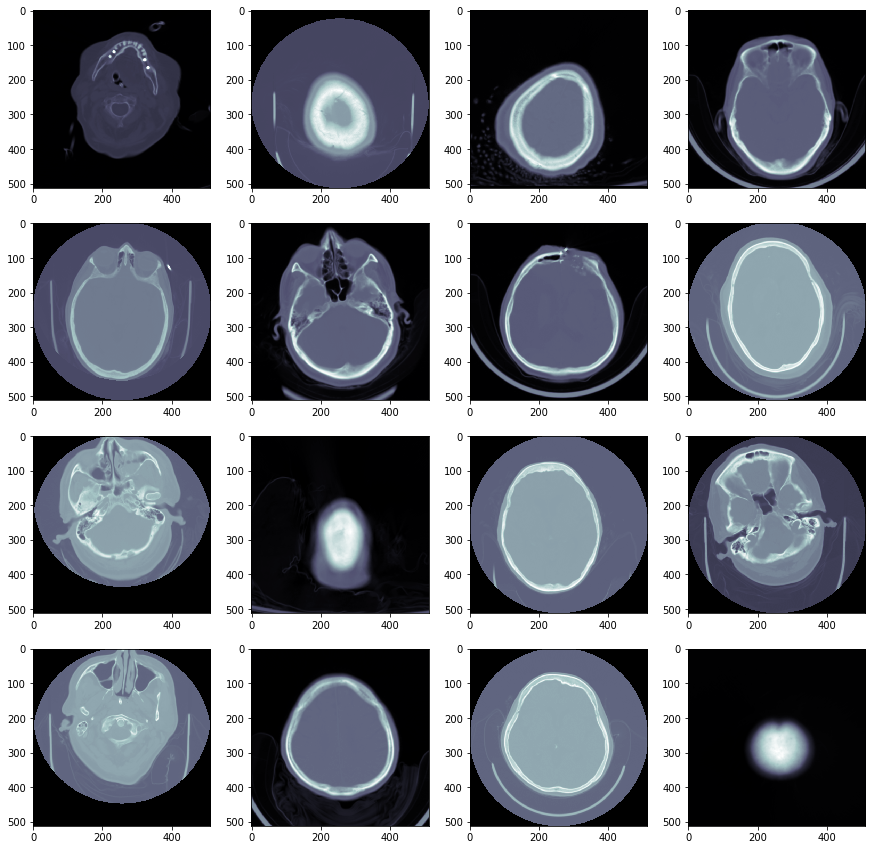

In [4]:
fig=plt.figure(figsize=(15, 15))
columns = 4
rows = 4
for i in range(1, columns*rows +1):
    img = pydicom.read_file(train_img_dir + train_images[i])
    plt.subplot(rows, columns, i)
    plt.imshow(img.pixel_array * img.RescaleSlope + img.RescaleIntercept, cmap=plt.cm.bone)

In [5]:
# DICOM format comes with metadata
print(img)

(0008, 0018) SOP Instance UID                    UI: ID_5ec46a66a
(0008, 0060) Modality                            CS: 'CT'
(0010, 0020) Patient ID                          LO: 'ID_01127830'
(0020, 000d) Study Instance UID                  UI: ID_a88e3aa247
(0020, 000e) Series Instance UID                 UI: ID_306ab22885
(0020, 0010) Study ID                            SH: ''
(0020, 0032) Image Position (Patient)            DS: [-113, 10, 645.300049]
(0020, 0037) Image Orientation (Patient)         DS: [1, 0, 0, 0, 1, 0]
(0028, 0002) Samples per Pixel                   US: 1
(0028, 0004) Photometric Interpretation          CS: 'MONOCHROME2'
(0028, 0010) Rows                                US: 512
(0028, 0011) Columns                             US: 512
(0028, 0030) Pixel Spacing                       DS: [0.42578125, 0.42578125]
(0028, 0100) Bits Allocated                      US: 16
(0028, 0101) Bits Stored                         US: 12
(0028, 0102) High Bit                        

The important pieces of information above are Window Center, Window Width, Rescale Intercept, Rescale Slope. The Window Center and Window Width are explained below. The Rescale Intercept and Rescale Slope describes the transformation between the stored values and the pixel values:

$$
pixelvalue = Rescale Slope * storedvalue + Rescale Intercept
$$

In [6]:
img.pixel_array

array([[23, 23, 22, ..., 24, 24, 23],
       [23, 23, 23, ..., 24, 24, 24],
       [23, 23, 23, ..., 24, 24, 24],
       ...,
       [16, 16, 16, ..., 26, 26, 26],
       [16, 15, 15, ..., 26, 26, 26],
       [16, 16, 15, ..., 26, 26, 25]], dtype=uint16)

In [7]:
img.pixel_array * img.RescaleSlope + img.RescaleIntercept

array([[-1001., -1001., -1002., ..., -1000., -1000., -1001.],
       [-1001., -1001., -1001., ..., -1000., -1000., -1000.],
       [-1001., -1001., -1001., ..., -1000., -1000., -1000.],
       ...,
       [-1008., -1008., -1008., ...,  -998.,  -998.,  -998.],
       [-1008., -1009., -1009., ...,  -998.,  -998.,  -998.],
       [-1008., -1008., -1009., ...,  -998.,  -998.,  -999.]])

# Windows

CT images uses radiodensity instead of gray intesity and the unit for the radiodensity is called Hounsfield units (HU). The value of the intensity depends on the density of the tissue. The usual interval for a CT scan is between -1000 and 1000 HUs, where higher values corresponds to denser tissues. If we directly turn this interval into 0-255 units of shade of gray, each unit would correspond to 8 HUs. Human eye can detect about ~15 shades of gray which corresponds to ~120 HUs. Most of the changes due to a hemorrhage happens in an interval of 80-100 HUs. Therefore, in order to able to detect these changes, radiologists use only a small interval of HUs values to scale onto 256 units of shades of gray. These small intervals are called windows. Each window is determined by its width and center. These choices depends on the purpose of the CT scan. For brain tissue, it is common to choose a width of 80 and centered at 40. So with this window the HU values between 0 and 80 will correspond to 256 shades of gray. We 

Here we should point out that, by taking into account these windows we are making the following assumption: The performence of the machine learning model will be better using the windows that are making the task easier for the human experts. 

The metadata that comes with dicom images contains default window images. The below code cell creates a dataframe consisting of the metadata and writes it into a csv file. 

## Parse the metadata

In [ ]:
corrupt_images = []
metadata = []
for i in range(len(train_images)):
    img = pydicom.read_file(train_img_dir + train_images[i])
    img_id = img[('0008', '0018')].value
    bits_allocated = img[('0028', '0100')].value
    bits_stored = img[('0028', '0101')].value
    pixel_rep = img[('0028', '0103')].value
    window_center, window_width = get_windowing(img)
    
    rescale_intercept = img[('0028', '1052')].value
    rescale_slope = img[('0028', '1053')].value

    try:
        pixel_min = img.pixel_array.min()
        pixel_max = img.pixel_array.max()
        pixel_median = np.median(img.pixel_array)
    except:
        corrupt_images.append(img_id)
        continue
    
    metadata.append([img_id, bits_allocated, bits_stored, pixel_rep, window_center, window_width, rescale_intercept, rescale_slope, pixel_min, pixel_max, pixel_median])

columns = ['id', 'bits_allocated', 'bits_stored', 'pixel_rep', 'window_center', 'window_width', 'rescale_intercept', 'rescale_slope', 'pixel_min', 'pixel_max', 'pixel_median']
metadata_df = pd.DataFrame(data = metadata, columns = columns)
metadata_df.to_csv('meta_data.csv', index = False) 

In [ ]:
# ID_6431af929 is a corrupt image.
corrupt_images

In [194]:
metadata_df = pd.read_csv("meta_data.csv")

In [195]:
metadata_df.head()

,id,bits_allocated,bits_stored,pixel_rep,window_center,window_width,rescale_intercept,rescale_slope,pixel_min,pixel_max,pixel_median
0,ID_30687de66,16,12,0,36,80,-1024.0,1.0,10,2632,99.0
1,ID_af423ce68,16,12,0,40,80,-1024.0,1.0,0,2477,24.0
2,ID_2ce81347c,16,16,1,30,80,-1024.0,1.0,-2000,2786,13.0
3,ID_3f7c431e5,16,16,1,30,80,-1024.0,1.0,-2000,2799,31.0
4,ID_70505b69c,16,12,0,36,80,-1024.0,1.0,11,2429,52.0


## Distribution of metadata values

In [10]:
metadata_df['window_center'].value_counts()

30     282676
36     250309
40     153344
35      48586
47      10377
50       3957
500       575
100       457
37        241
38        222
650       191
45        187
43        159
32        149
600       134
60        114
80        108
33        103
41        102
39        100
53         66
51         63
210        59
25         59
350        56
48         39
54         37
42         35
57         34
29         34
28         34
63         33
64         33
27         33
44         32
800        32
300        32
Name: window_center, dtype: int64

In [11]:
metadata_df['window_width'].value_counts()

80      613938
150      64848
100      34375
135      32003
120       2159
85         724
70         536
2500       531
600        457
110        368
4000       349
95         344
360        145
78         132
71         132
81         131
73         131
400        129
72         124
79         123
300        110
77         102
90          68
68          68
67          64
3000        64
599         59
83          46
2000        44
26          42
108         38
107         36
69          36
242         35
32          35
335         34
54          34
76          33
66          33
74          32
4095        32
64          31
62          31
60          16
Name: window_width, dtype: int64

From the above value counts we see that most of the default windows are close to the brain window, however there are images with default windows significantly different than brain window. This tells us that we can't just rely on the default window values. I decided to use these default values in addition to fixed brain and subdural windows. 

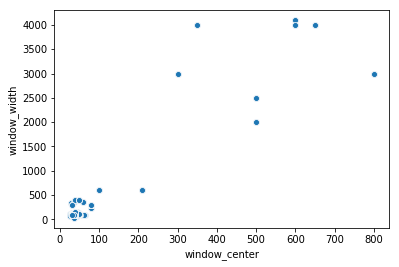

In [12]:
sns.scatterplot(x = 'window_center', y = 'window_width', data = metadata_df)

In [197]:
metadata_df[['window_center', 'window_width']].describe()            

,window_center,window_width
count,752802.000000,752802.000000
mean,35.473350,93.973960
std,19.404427,116.141843
min,25.000000,26.000000
25%,30.000000,80.000000
50%,36.000000,80.000000
75%,36.000000,80.000000
max,800.000000,4095.000000


## Apply windowing

`correct_dcm` function below is taken from this [kernel](https://www.kaggle.com/jhoward/cleaning-the-data-for-rapid-prototyping-fastai). 

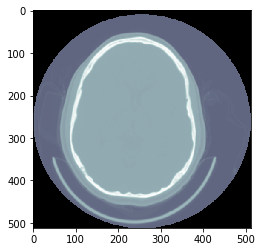

In [202]:
img = pydicom.read_file('images/ID_00019828f.dcm')
plt.imshow(img.pixel_array * img.RescaleSlope + img.RescaleIntercept, cmap=plt.cm.bone)

In [203]:
def get_first_of_dicom_field_as_int(x):
    if type(x) == pydicom.multival.MultiValue:
        return int(x[0])
    else:
        return int(x)

def get_windowing(data):
    dicom_fields = [data[('0028','1050')].value, #window center
                    data[('0028','1051')].value] #window width
    return [get_first_of_dicom_field_as_int(x) for x in dicom_fields]

def correct_dcm(dcm):
    x = dcm.pixel_array + 1000
    px_mode = 4096
    x[x >= px_mode] = x[x >= px_mode] - px_mode
    dcm.PixelData = x.tobytes()
    dcm.RescaleIntercept = -1000

def window_image(dcm, window_center, window_width, correction = True):
    if correction:
        if (dcm.BitsStored == 12) & (dcm.PixelRepresentation == 0) & (int(dcm.RescaleIntercept) > -5):
            correct_dcm(dcm)
    
    img = dcm.pixel_array * dcm.RescaleSlope + dcm.RescaleIntercept
    img_min = window_center - window_width//2
    img_max = window_center + window_width//2
    img = np.clip(img, img_min, img_max)
    
    img = (img - img_min) / (img_max - img_min)
                    
    return img

def show_images(img_paths):
    n_imgs = len(img_paths)
    for n, img_path in enumerate(img_paths):
        dcm = pydicom.read_file(img_path)
        window_center, window_width = get_windowing(dcm)

        brain_channel = window_image(dcm, 40, 80)
        subdural_channel = window_image(dcm, 80, 200)
        default_channel = window_image(dcm, window_center, window_width)
        arr = np.array([brain_channel, subdural_channel, default_channel]).transpose(1,2,0)

        channels = ['brain', 'subdural', 'default']
        fig=plt.figure(figsize=(20*n_imgs, 60))

        for i in range(3):
            plt.subplot(n+1,3,i+1)
            plt.imshow(arr[:,:,i], cmap=plt.cm.bone)
            plt.title(channels[i])


Let's look at the corrected image with the additional windows.

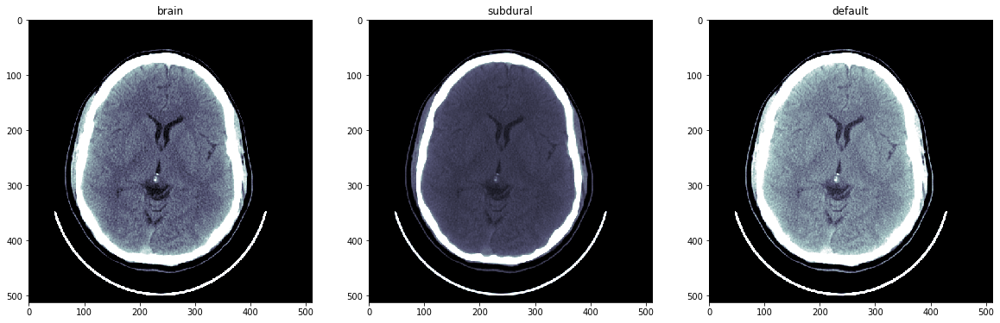

In [204]:
show_images(['images/ID_00019828f.dcm'])

Let's look at example images from each subtype. The subtypes depends on where the hemorrhage is in the brain. Images are taken from the competition [page](https://www.kaggle.com/c/rsna-intracranial-hemorrhage-detection/overview/hemorrhage-types)

![subtypes](https://www.googleapis.com/download/storage/v1/b/kaggle-user-content/o/inbox%2F603584%2F56162e47358efd77010336a373beb0d2%2Fsubtypes-of-hemorrhage.png?generation=1568657910458946&alt=media)

![layers](https://www.googleapis.com/download/storage/v1/b/kaggle-user-content/o/inbox%2F603584%2Fda30220341a8c77a9925868023698b8f%2FMeninges-en.png?generation=1566848157664036&alt=media)


In [223]:
train_df = pd.read_csv('stage_2_train.csv')

### Epidural

In [26]:
epidural_exs = train_df[(train_df['class'] == 'epidural') & (train_df['Label'] == 1)]['id'].values

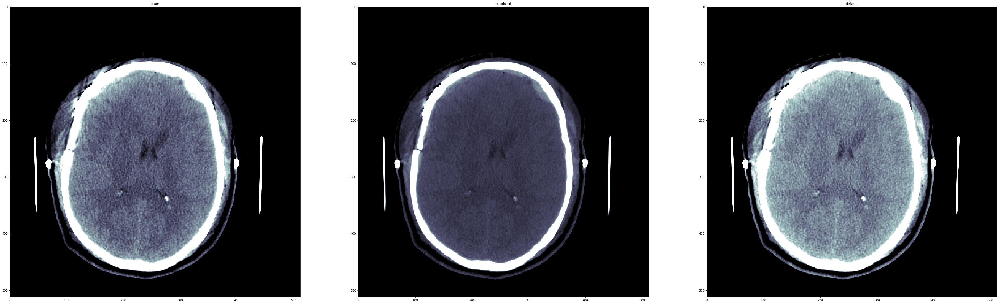

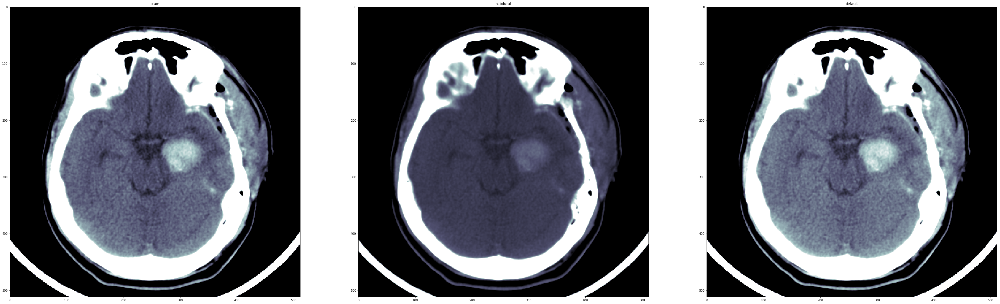

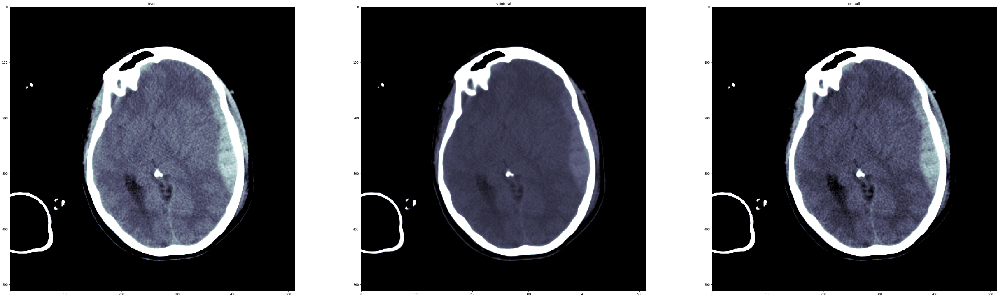

In [27]:
show_images([train_img_dir + img_id + '.dcm' for img_id in epidural_exs[:3]])

### Subdural

In [28]:
subdural_exs = train_df[(train_df['class'] == 'subdural') & (train_df['Label'] == 1)]['id'].values

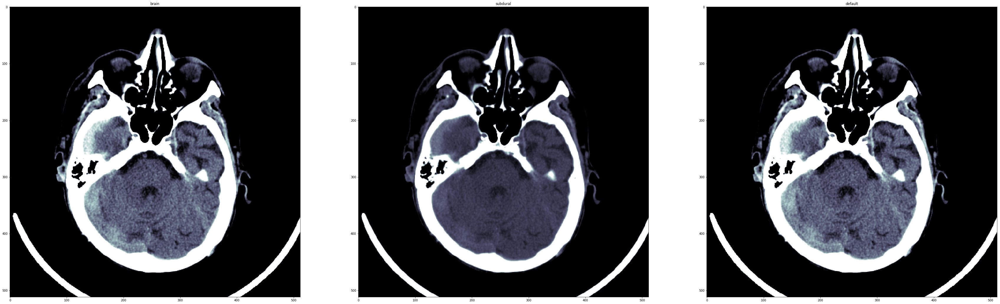

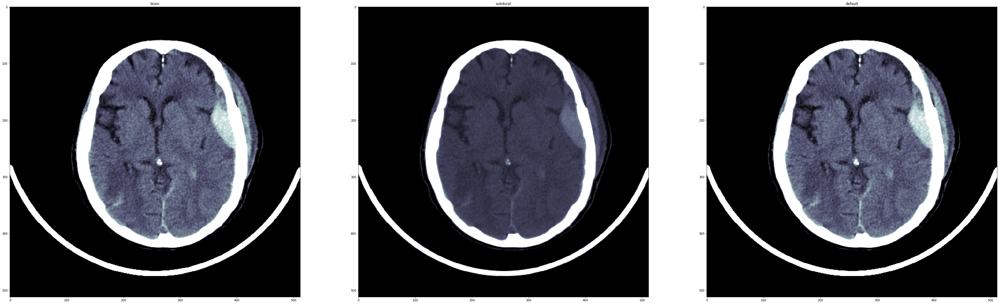

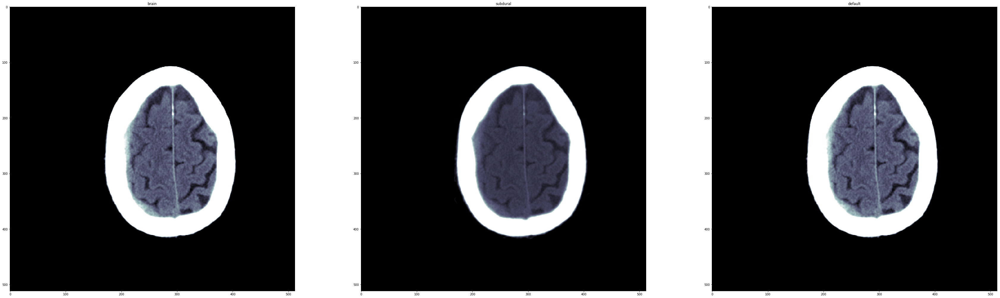

In [29]:
show_images([train_img_dir + img_id + '.dcm' for img_id in subdural_exs[:3]])

### subarachnoid

In [30]:
subarachnoid_exs = train_df[(train_df['class'] == 'subarachnoid') & (train_df['Label'] == 1)]['id'].values

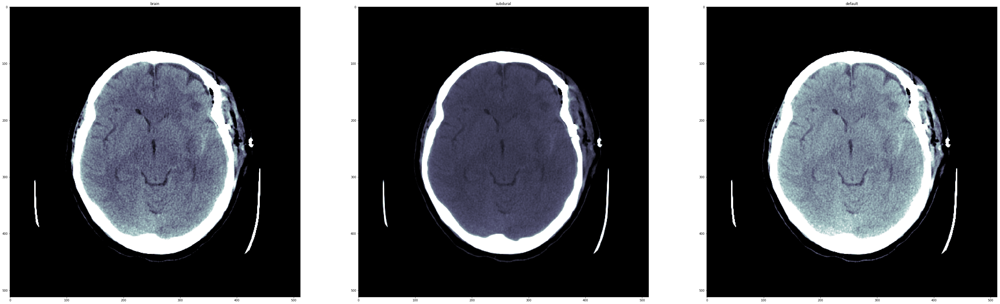

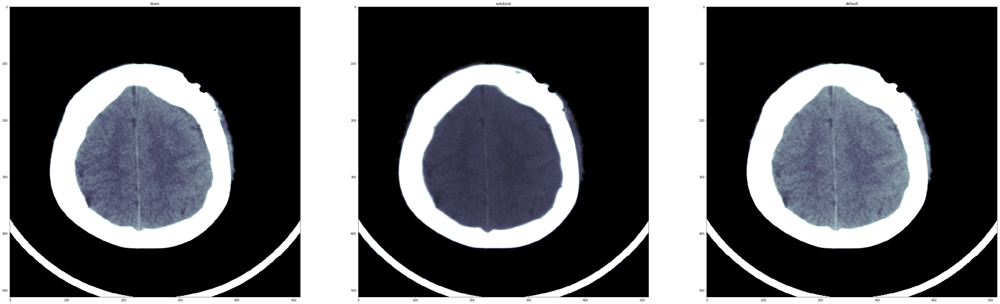

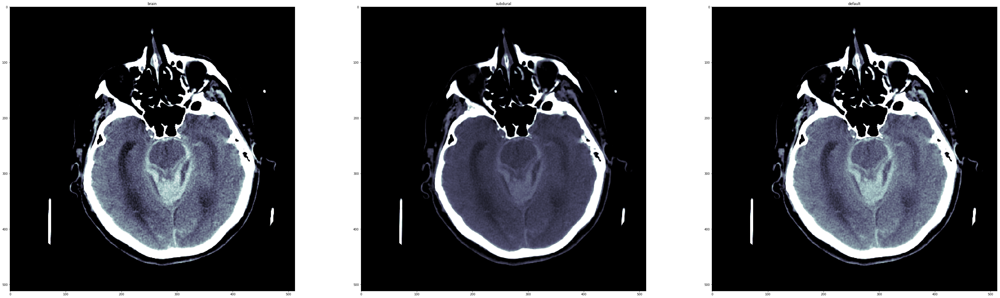

In [31]:
show_images([train_img_dir + img_id + '.dcm' for img_id in subarachnoid_exs[:3]])

### intraparenchymal

In [32]:
intraparenchymal_exs = train_df[(train_df['class'] == 'intraparenchymal') & (train_df['Label'] == 1)]['id'].values

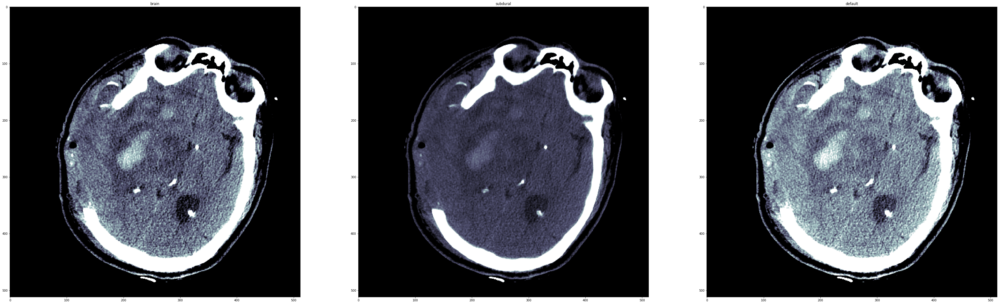

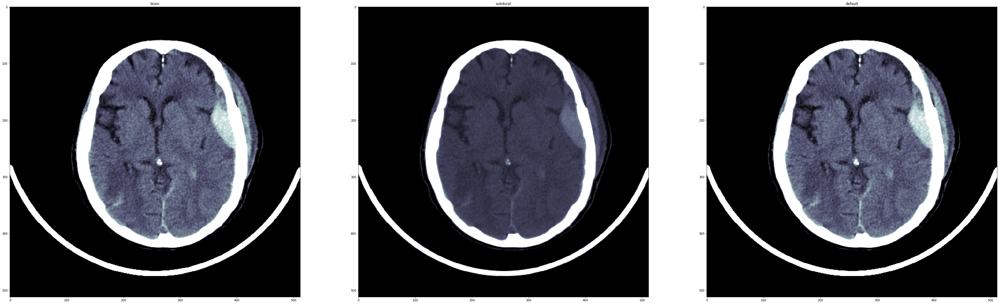

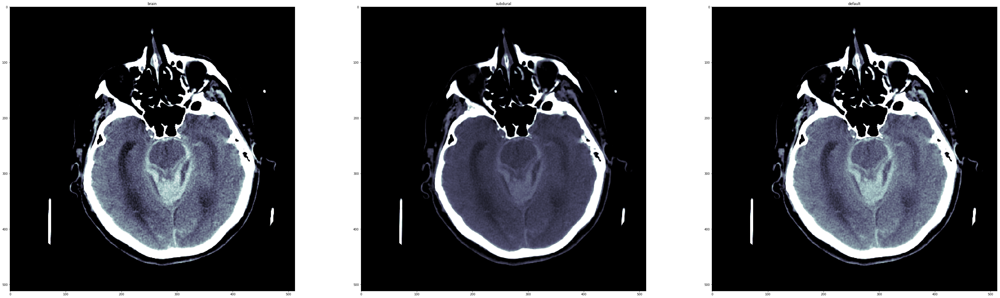

In [33]:
show_images([train_img_dir + img_id + '.dcm' for img_id in intraparenchymal_exs[:3]])

### intraventricular

In [34]:
intraventricular_exs = train_df[(train_df['class'] == 'intraventricular') & (train_df['Label'] == 1)]['id'].values

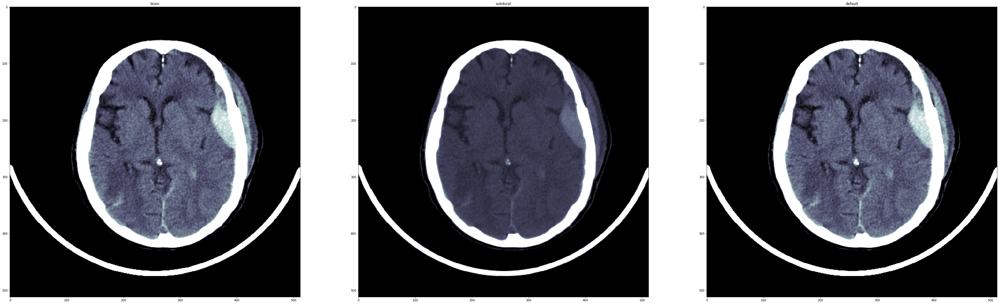

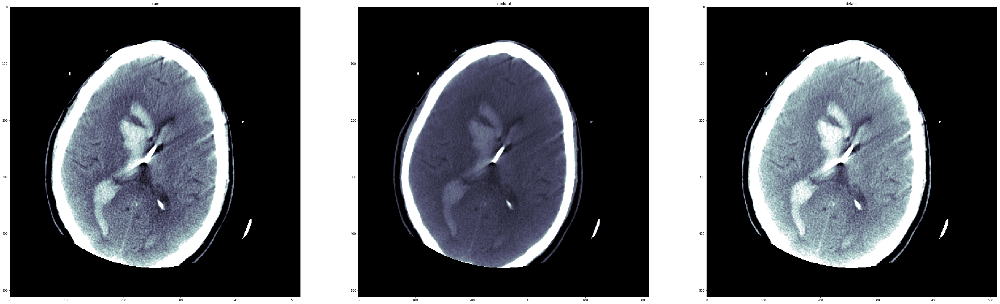

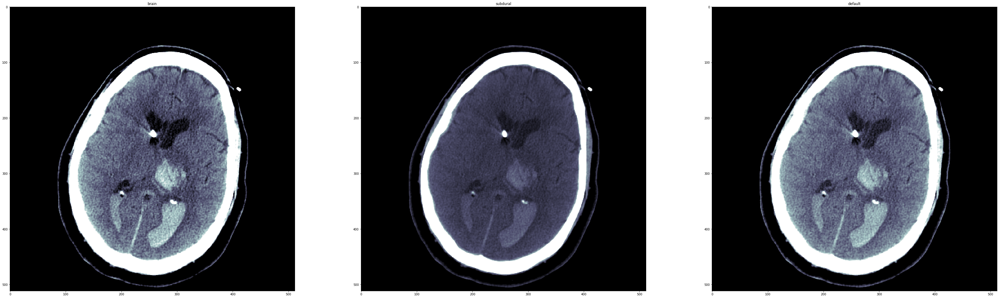

In [35]:
show_images([train_img_dir + img_id + '.dcm' for img_id in intraventricular_exs[:3]])

## Labels

In [7]:
train_df = pd.read_csv('stage_2_train.csv')

In [8]:
train_df.head(12)

,ID,Label
0,ID_12cadc6af_epidural,0
1,ID_12cadc6af_intraparenchymal,0
2,ID_12cadc6af_intraventricular,0
3,ID_12cadc6af_subarachnoid,0
4,ID_12cadc6af_subdural,0
5,ID_12cadc6af_any,0
6,ID_38fd7baa0_epidural,0
7,ID_38fd7baa0_intraparenchymal,0
8,ID_38fd7baa0_intraventricular,0
9,ID_38fd7baa0_subarachnoid,0


In [9]:
train_df['id'] = train_df['ID'].apply(lambda x: x.split('_')[0] + '_' + x.split('_')[1])
train_df['class'] = train_df['ID'].apply(lambda x: x.split('_')[2])
train_df.head()

,ID,Label,id,class
0,ID_12cadc6af_epidural,0,ID_12cadc6af,epidural
1,ID_12cadc6af_intraparenchymal,0,ID_12cadc6af,intraparenchymal
2,ID_12cadc6af_intraventricular,0,ID_12cadc6af,intraventricular
3,ID_12cadc6af_subarachnoid,0,ID_12cadc6af,subarachnoid
4,ID_12cadc6af_subdural,0,ID_12cadc6af,subdural


## Class imbalance

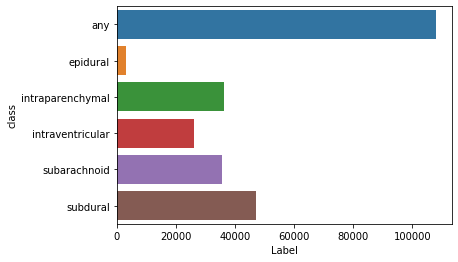

In [10]:
grouped_by_class = train_df.groupby('class').sum()
sns.barplot(y=grouped_by_class.index, x=grouped_by_class.Label) 

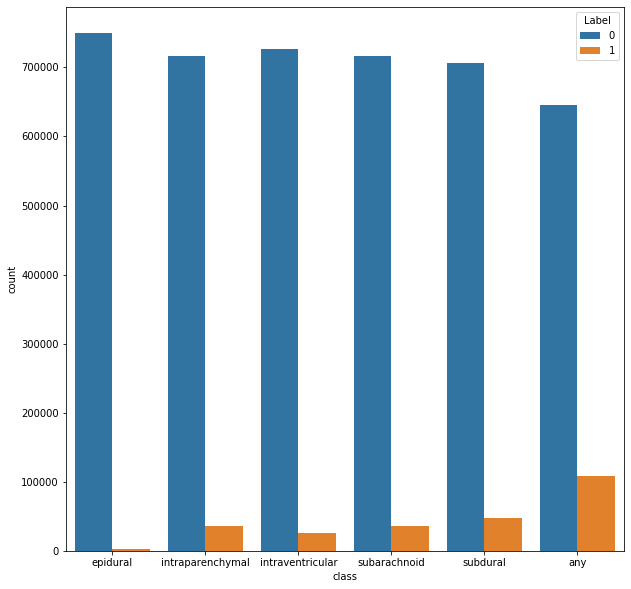

In [11]:
fig=plt.figure(figsize=(10, 10))
sns.countplot(x="class", hue="Label", data=train_df)

In [25]:
train_df.groupby('class').sum()/len(train_images)

,Label
class,
any,0.143375
epidural,0.004178
intraparenchymal,0.047978
intraventricular,0.034810
subarachnoid,0.047390
subdural,0.062654


The above plots shows that the classes are highly imbalanced, especially the 'epidural' subtype. There is also an imbalance between the images with hemorrhage vs without hemorrhage as shown by the 'any' class. 

## Create a new dataframe that consists of one row per image

In [12]:
train_df = train_df.drop(columns = ['ID'])
train_df = train_df.drop_duplicates()

In [13]:
# Get class names
CLASS_NAMES = train_df[:6]['class'].values
print(CLASS_NAMES)

['epidural' 'intraparenchymal' 'intraventricular' 'subarachnoid'
 'subdural' 'any']


In [ ]:
# Create one row per image ID
CLASS_NAMES = np.array(CLASS_NAMES)
grouped = train_df.groupby(by='id')
labels = []
ids = []
classes = []
for name, group in grouped:
    label = list(group['Label'].values)
    labels.append(label)
    classes.append(''.join(list(CLASS_NAMES[np.array(label) == 1])))
    ids.append(name)

train_id_df = pd.DataFrame(labels, columns = CLASS_NAMES)
train_id_df['ID'] = ids
train_id_df['class'] = classes
train_id_df = train_id_df.sample(frac=1)
train_id_df.head()

train_id_df.to_csv('one_hot_labels.csv', index = False)

In [205]:
ground_truth = pd.read_csv("one_hot_labels.csv")
ground_truth = ground_truth.fillna('x')
ground_truth['one_hot'] = list(ground_truth[CLASS_NAMES].values)
ground_truth.head()

,epidural,intraparenchymal,intraventricular,subarachnoid,subdural,any,ID,class,one_hot
0,0,0,0,0,0,0,ID_327e33972,x,"[0, 0, 0, 0, 0, 0]"
1,0,0,1,0,0,1,ID_cedd11e21,intraventricularany,"[0, 0, 1, 0, 0, 1]"
2,0,0,0,0,0,0,ID_f88929622,x,"[0, 0, 0, 0, 0, 0]"
3,0,0,0,0,0,0,ID_02595b48e,x,"[0, 0, 0, 0, 0, 0]"
4,0,0,1,0,0,1,ID_769385a56,intraventricularany,"[0, 0, 1, 0, 0, 1]"


The "one hot" labels shows that an image can have more than one subtype assigned to it. This shows that we can think of the problem as a multi label binary classification problem rather than a multi class classification problem. We will create a custom loss function which computes the binary crossentropy loss on each label and take a weighted average with class weights computed using class frequencies in the training data as below. The weight for the any class is assigned to the sum of all the weights for each subtype. 

In [206]:
length = len(ground_truth)
class_weights = [length/(8*ground_truth[label].sum()) for label in CLASS_NAMES[:-1]]
class_weights += [sum(class_weights)]
for cls, weight in zip(CLASS_NAMES, class_weights):
    print(cls, weight)

epidural 29.9206279809221
intraparenchymal 2.605359516030788
intraventricular 3.5909320740316732
subarachnoid 2.6377119831814997
subdural 1.9950891532035788
any 40.74972070736963


Below is the custom loss we created using the above class weights. The loss is defined as the weighted average of the binary crossentropy losses calculated for each label. 

In [16]:
class WeightedLoss(tf.keras.losses.Loss):
    def __init__(self, class_weights, **kwargs):
        self.class_weights = class_weights
        super().__init__(**kwargs)
        
    def call(self, y_true, y_pred):
        y_true = tf.expand_dims(y_true, -1)
        y_pred = tf.expand_dims(y_pred, -1)

        loss_per_class = tf.keras.losses.BinaryCrossentropy(reduction = tf.keras.losses.Reduction.NONE)
        
        weighted_average = tf.reduce_sum(loss_per_class(y_true, y_pred) * self.class_weights, axis = 1)/tf.reduce_sum(self.class_weights)

        return tf.reduce_mean(weighted_average)
                        
    def get_config(self):
        base_config = super().get_config()
        return {**base_config, "class_weights": self.class_weights}

### Images with multiple diagnosis

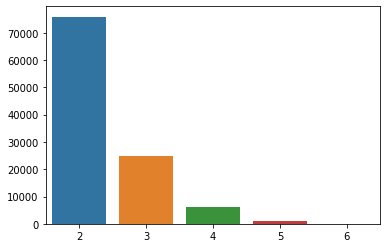

In [17]:
multiple_subtypes = ground_truth['one_hot'].apply(lambda x: x.sum()).value_counts()
sns.barplot(x=multiple_subtypes.index[1:], y=multiple_subtypes.values[1:])

In [42]:
multiple_subtypes

0    644870
2     75859
3     24826
4      6217
5      1008
6        23
Name: one_hot, dtype: int64

In [43]:
all_types = ground_truth.query('(epidural == 1) & (intraparenchymal == 1) & (intraventricular == 1) & (subarachnoid == 1) & (subdural == 1) & (any == 1)')

In [44]:
all_types.head()

,epidural,intraparenchymal,intraventricular,subarachnoid,subdural,any,ID,class,one_hot
33190,1,1,1,1,1,1,ID_dcbb83e46,epiduralintraparenchymalintraventricularsubara...,"[1, 1, 1, 1, 1, 1]"
93278,1,1,1,1,1,1,ID_46887c63e,epiduralintraparenchymalintraventricularsubara...,"[1, 1, 1, 1, 1, 1]"
148664,1,1,1,1,1,1,ID_63eb7a3ff,epiduralintraparenchymalintraventricularsubara...,"[1, 1, 1, 1, 1, 1]"
184896,1,1,1,1,1,1,ID_2a42ed30a,epiduralintraparenchymalintraventricularsubara...,"[1, 1, 1, 1, 1, 1]"
200308,1,1,1,1,1,1,ID_88c75570e,epiduralintraparenchymalintraventricularsubara...,"[1, 1, 1, 1, 1, 1]"


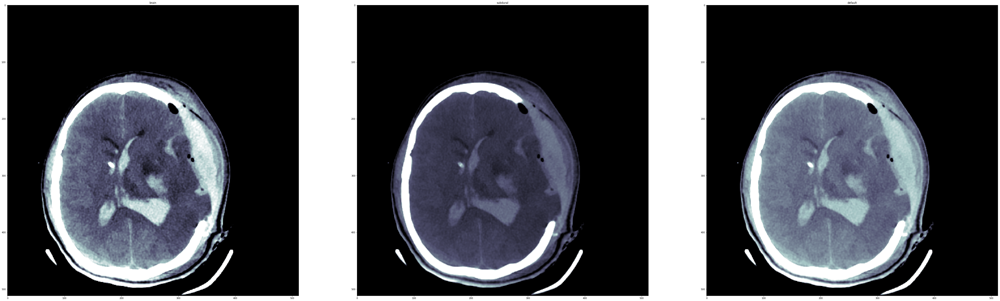

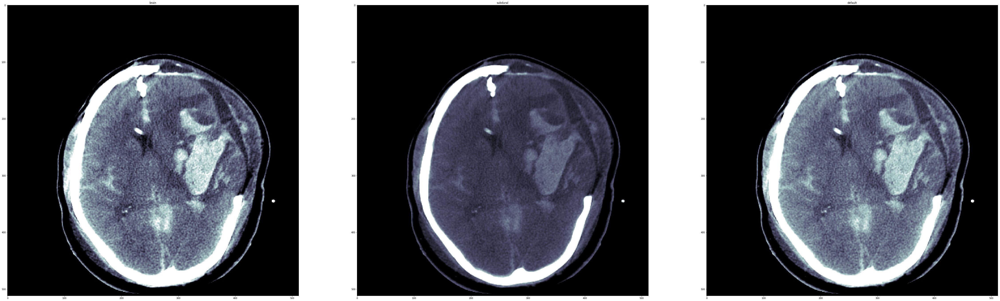

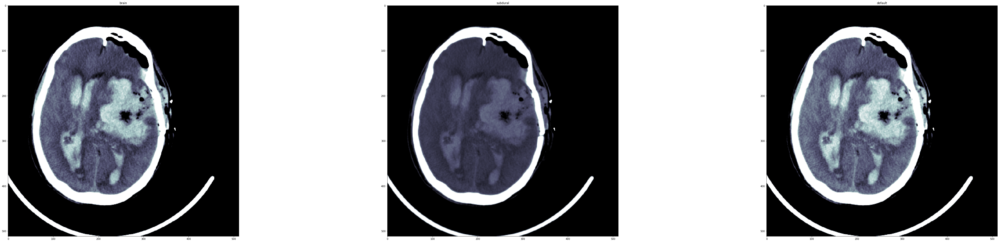

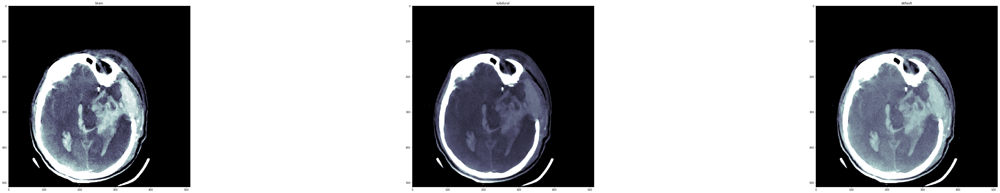

In [45]:
show_images([train_img_dir + img_id +'.dcm' for img_id in all_types.iloc[:4]['ID']])

## Performance measure

The model is trained using the weighted loss we created above using class weights according to the occurances of each subtype. 

In [18]:
model = tf.keras.models.load_model("model_at_epoch_16.hdf5", compile = False)

model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.001),
                        loss = WeightedLoss(class_weights))

In [81]:
def read_tfrecord(example):
    features = {
                'one_hot_label': tf.io.FixedLenFeature((), tf.string),
                'bottleneck_features': tf.io.FixedLenFeature((), tf.string)
    }
    example = tf.io.parse_single_example(example, features)
    bottleneck_features = tf.io.parse_tensor(example['bottleneck_features'], out_type = tf.float32)
    bottleneck_features = tf.reshape(bottleneck_features, [-1])
    one_hot_label = tf.io.parse_tensor(example['one_hot_label'], out_type = tf.int64)
    
    bottleneck_features.set_shape([1920])
    one_hot_label.set_shape([6])
    
    return bottleneck_features, one_hot_label

def create_dataset(record_dir, batch_size = 32):
    #train_dataset = tf.data.Dataset.list_files(record_dir + "train*.tfrecords")
    filenames = tf.io.gfile.glob(record_dir + "train*.tfrecords")
    train_dataset = tf.data.TFRecordDataset(filenames)
    train_dataset = train_dataset.map(read_tfrecord).repeat().shuffle(10000).batch(batch_size)
    
    #val_dataset = tf.data.Dataset.list_files(record_dir + "valid*.tfrecords")
    val_filenames = tf.io.gfile.glob(record_dir + "valid*.tfrecords")
    val_dataset = tf.data.TFRecordDataset(val_filenames)
    val_dataset = val_dataset.map(read_tfrecord).batch(batch_size)
    
    return train_dataset, val_dataset


record_dir = "TFRecords/"
train_dataset, val_dataset = create_dataset(record_dir, batch_size = 32)

In [82]:
model.evaluate(val_dataset)

   1177/Unknown - 8s 7ms/step - loss: 0.1768

0.17676297233724048

Our submission on Kaggle using this model received a loss of 0.177 on the test set which consists of ~120000 images. So the validation set gives a good estimate for the generalization error. This also shows that the class weights we calculated are somewhat close to the class weights used by the organizers. 

In [83]:
y_pred = model.predict(val_dataset)
y_pred.shape

(37641, 6)

In [84]:
for _,  y_true in val_dataset.unbatch().batch(37641):
    print(y_true.shape)

(37641, 6)


In [85]:
# sanity check
loss = WeightedLoss(class_weights)
loss(y_true, tf.cast(y_pred, dtype = tf.float64))

<tf.Tensor: shape=(), dtype=float64, numpy=0.17678329348564148>

In [106]:
def apply_threshold(y_pred, threshold = 0.5):
    y_labels = y_pred.copy()
    
    y_labels[y_labels >= threshold] = 1 
    y_labels[y_labels < threshold] = 0 
    return y_labels

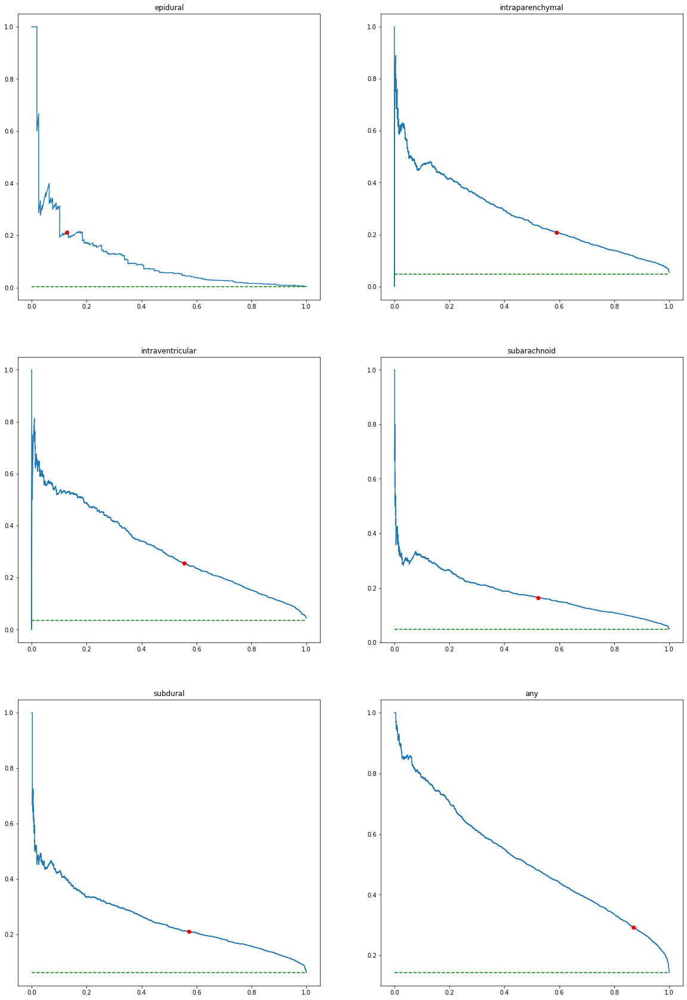

In [219]:
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import recall_score, precision_score

y_labels = apply_threshold(y_pred, threshold = 0.1)

plt.figure(figsize=(20,30))

for i, class_name in enumerate(CLASS_NAMES):
    
    #Precision-recall curve
    precision, recall, thresholds = precision_recall_curve(y_true[:,i], y_pred[:,i])
    plt.subplot(3,2,i+1)
    plt.plot(recall, precision)
    
    #precision-recall for the current threshold
    recall = recall_score(y_true[:,i], y_labels[:,i])
    precision = precision_score(y_true[:,i], y_labels[:,i])
    plt.plot(recall, precision, 'ro')
    
    #Baseline for random classifier
    positive_class_ratio = y_true[:,i].numpy().sum()/len(y_true)
    plt.plot([0,1], [positive_class_ratio]*2, '--g')
    plt.title(class_name)

### Confusion matrices

In [221]:
from sklearn.metrics import multilabel_confusion_matrix, classification_report, balanced_accuracy_score

confusion_matrix = multilabel_confusion_matrix(y_true, y_labels)

for i, class_name in enumerate(CLASS_NAMES):
    print('The confusion matrix for class {}:'.format(class_name))
    print(confusion_matrix[i])

The confusion matrix for class epidural:
[[37410    74]
 [  137    20]]
The confusion matrix for class intraparenchymal:
[[31811  4023]
 [  742  1065]]
The confusion matrix for class intraventricular:
[[34214  2117]
 [  584   726]]
The confusion matrix for class subarachnoid:
[[31096  4761]
 [  851   933]]
The confusion matrix for class subdural:
[[30241  5042]
 [ 1011  1347]]
The confusion matrix for class any:
[[20838 11406]
 [  699  4698]]


### Balanced accuracy

Balanced accuracy is defined as the average of the recall obtained in each class. In the code cell below we calculate the balanced accuracy score for each label. 

In [222]:
for i, class_name in enumerate(CLASS_NAMES):
    ba = balanced_accuracy_score(y_true[:,i], y_labels[:,i])
    print('Balanced accuracy for the class {} is {}'.format(class_name, ba))

Balanced accuracy for the class epidural is 0.5627071796917853
Balanced accuracy for the class intraparenchymal is 0.7385534876909975
Balanced accuracy for the class intraventricular is 0.7479643380697535
Balanced accuracy for the class subarachnoid is 0.6951023206781397
Balanced accuracy for the class subdural is 0.7141725693211682
Balanced accuracy for the class any is 0.7583716856302545
